In [1]:
# ! pip install catboost
import librosa
from IPython.display import Audio
import librosa.display
import soundfile as sf
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import time
import csv
import os
import warnings
warnings.filterwarnings('ignore')

from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_auc_score
from catboost import Pool, CatBoostClassifier, cv, CatBoostRegressor
from sklearn.ensemble import RandomForestClassifier


### Primeiro  Classical

In [2]:
audio_path = 'mini-genres/classical/'
audio_files = ['classical.00000.au', 'classical.00001.au', 'classical.00002.au', 'classical.00003.au', \
             'classical.00004.au', 'classical.00005.au', 'classical.00006.au', 'classical.00007.au', \
             'classical.00008.au', 'classical.00009.au']

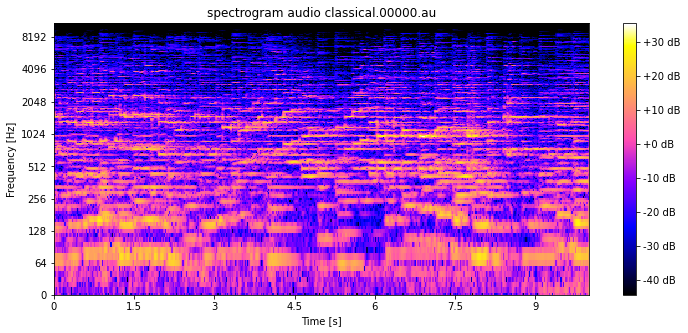

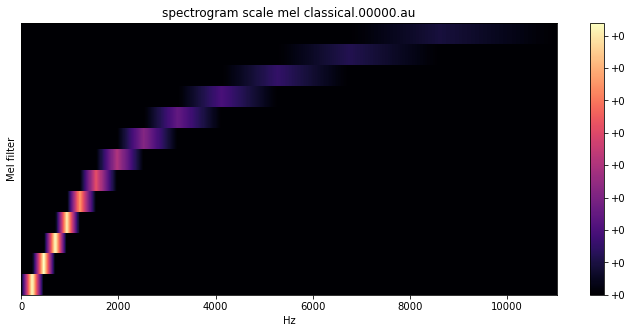

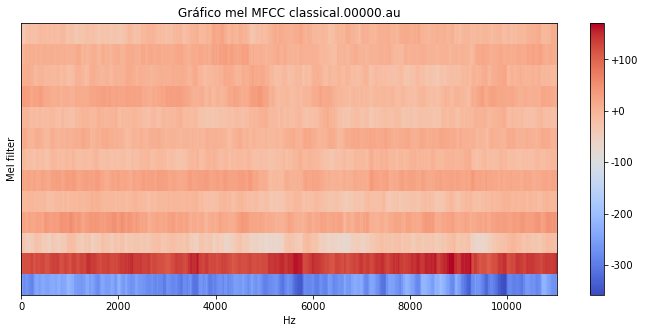

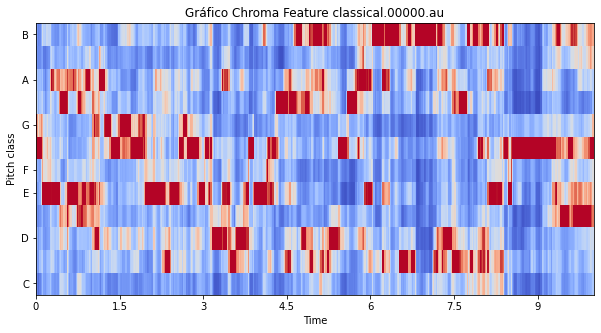

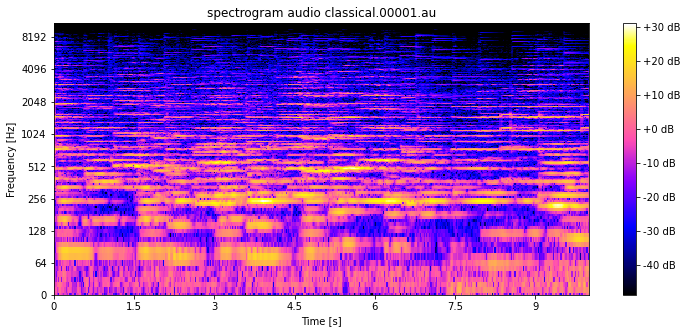

...

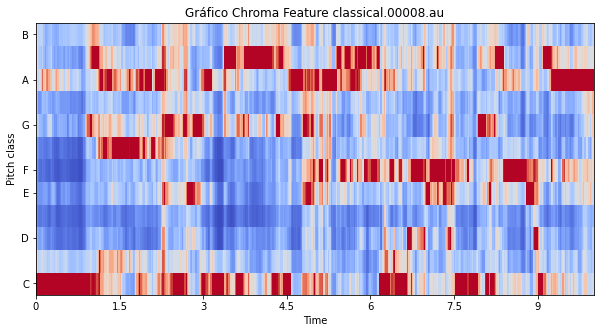

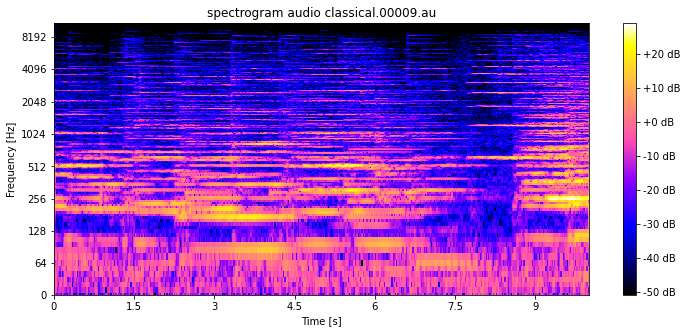

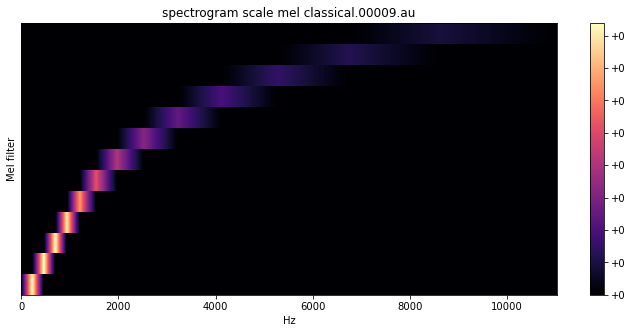

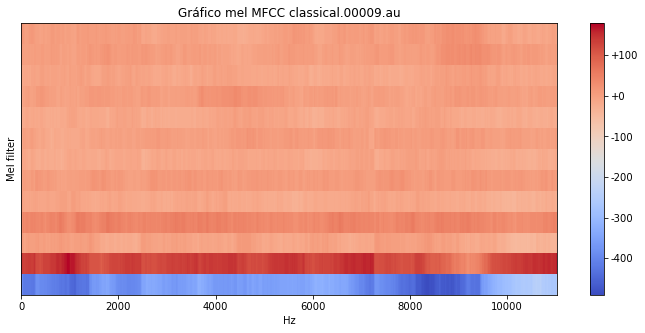

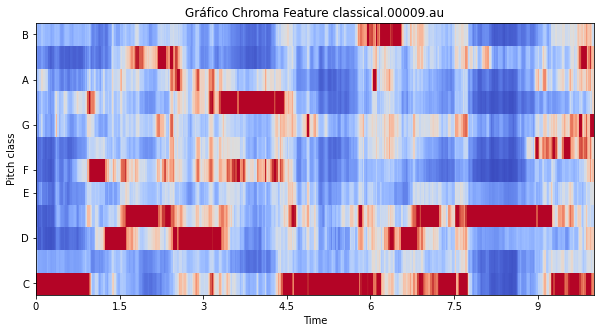

In [3]:
# For plotting headlessly
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

features = []
audio_dic = {}

for file in audio_files:
    # Carregando file
    sound, samplerate  = librosa.load(path=audio_path+file, offset=0, duration=10)
    #
    # 1. Espectograma em escala logartimo
    #
    # Aplicando Short Time Fourier Transform no audio
    F = librosa.stft(sound)
    # Calculando a magnitude
    Magnitude = np.abs(F)
    # Transformando os dados em decibeis
    Spectro = librosa.amplitude_to_db(Magnitude)
    # Adicionando feature a lista
    features.append(Spectro)    
    # Salvando Spectograma
    fig = plt.figure(figsize=(12,5))
    p = librosa.display.specshow(Spectro, sr=samplerate, y_axis='log' , x_axis='time', cmap='gnuplot2')
    plt.xlabel('Time [s]')
    plt.ylabel('Frequency [Hz]')
    title = "spectrogram audio {}".format(file)
    plt.title(title)
    plt.colorbar(format='%+2.0f dB')
    fig.savefig(file+'-spec.png')
    
    #
    # 2. Espectograma em escala de mel (MFCC) para n_mcc=13
    #
    mel = librosa.filters.mel(sr=samplerate, n_fft=2048 ,n_mels=13)
    # Adicionando feature a lista
    features.append(mel)    
    # Salvando o gráfico de mel
    fig = plt.figure(figsize=(12,5))
    p = librosa.display.specshow(mel, sr=samplerate, x_axis='linear');
    plt.ylabel('Mel filter');
    title = "spectrogram scale mel {}".format(file)
    plt.title(title)
    plt.colorbar(format='%+2.0f')
    fig.savefig(file+'-mel.png')
    
    #
    # 3. Grafico de mel pegando o mfcc

    mfcc = librosa.feature.mfcc(y=sound, sr=samplerate, n_mfcc=13)
    fig = plt.figure(figsize=(12,5))
    p = librosa.display.specshow(mfcc, sr=samplerate, x_axis='linear');
    plt.ylabel('Mel filter');
    title = "Gráfico mel MFCC {}".format(file)
    plt.title(title)
    plt.colorbar(format='%+2.0f')

    
    
    # 4. Chroma feature
    #
    chroma = librosa.feature.chroma_stft(S=Magnitude, sr=samplerate)
    # Adicionando feature a lista
    features.append(chroma)
    # Salvando Chroma feature
    fig = plt.figure(figsize=(10,5))
    p = librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', cmap='coolwarm')
    title = "Gráfico Chroma Feature {}".format(file)
    plt.title(title)
    fig.savefig(file+'-chroma.png')
    
    # Adicionando lista ao dicionario
    audio_dic[file] = features

### Segundo  Jazz

In [4]:
audio_path = 'mini-genres/jazz/'
audio_files = ['jazz.00000.au', 'jazz.00001.au', 'jazz.00002.au', 'jazz.00003.au', \
             'jazz.00004.au', 'jazz.00005.au', 'jazz.00006.au', 'jazz.00007.au', \
             'jazz.00008.au', 'jazz.00009.au']

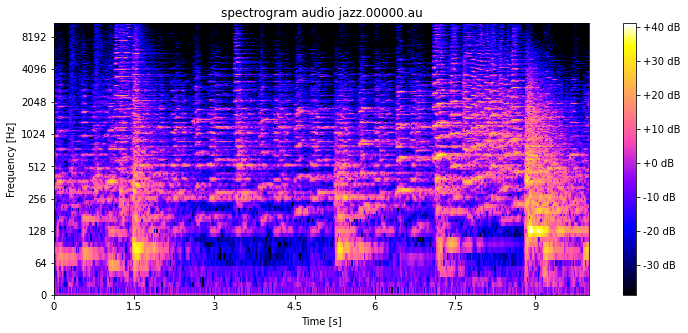

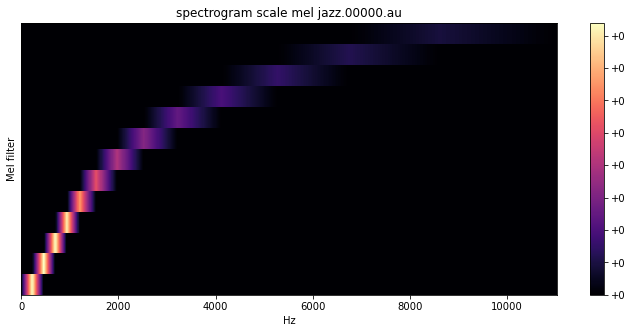

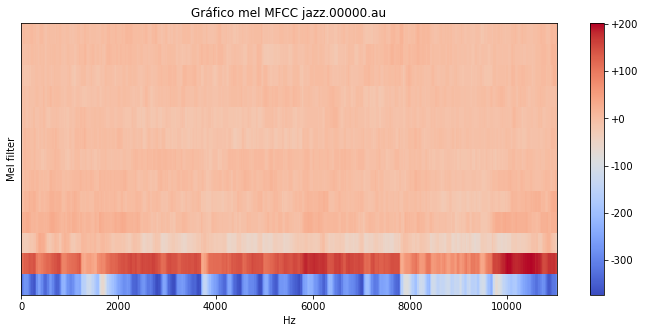

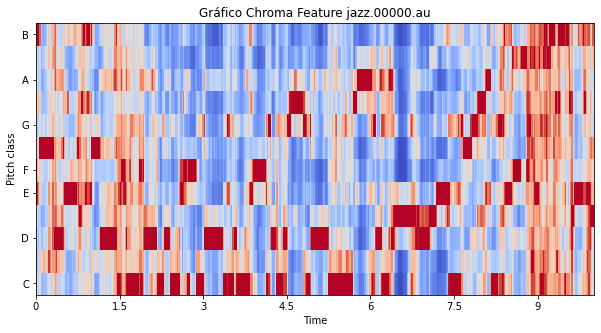

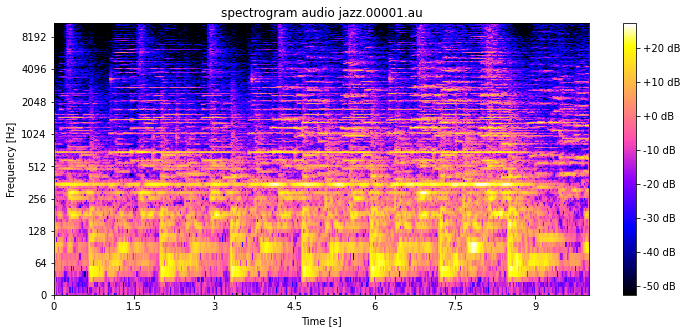

...

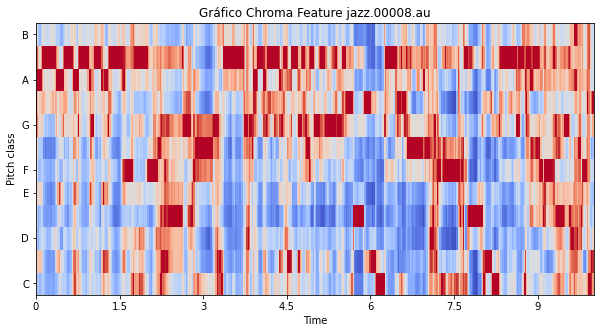

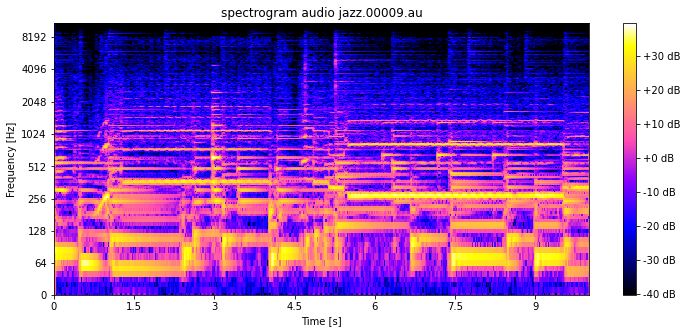

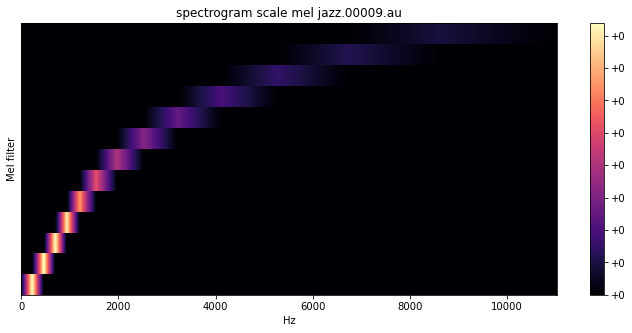

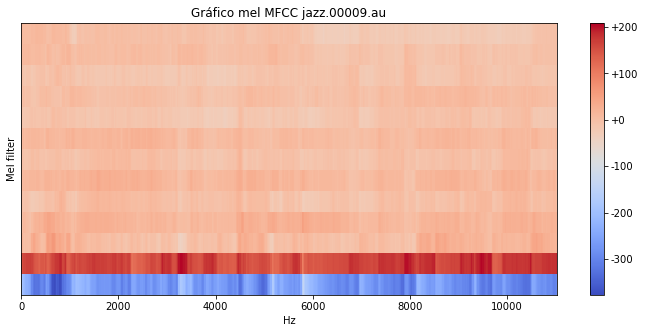

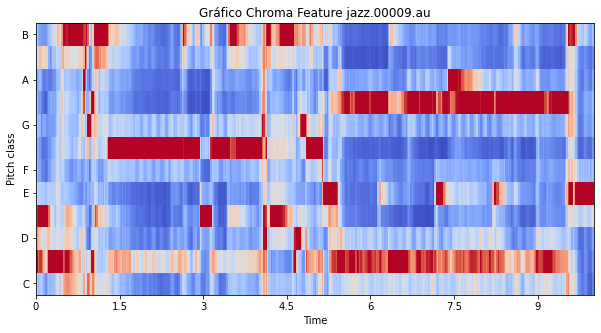

In [5]:
# For plotting headlessly
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

features = []
audio_dic = {}

for file in audio_files:
    # Carregando file
    sound, samplerate  = librosa.load(path=audio_path+file, offset=0, duration=10)
    #
    # 1. Espectograma em escala logartimo
    #
    # Aplicando Short Time Fourier Transform no audio
    F = librosa.stft(sound)
    # Calculando a magnitude
    Magnitude = np.abs(F)
    # Transformando os dados em decibeis
    Spectro = librosa.amplitude_to_db(Magnitude)
    # Adicionando feature a lista
    features.append(Spectro)    
    # Salvando Spectograma
    fig = plt.figure(figsize=(12,5))
    p = librosa.display.specshow(Spectro, sr=samplerate, y_axis='log' , x_axis='time', cmap='gnuplot2')
    plt.xlabel('Time [s]')
    plt.ylabel('Frequency [Hz]')
    title = "spectrogram audio {}".format(file)
    plt.title(title)
    plt.colorbar(format='%+2.0f dB')
    fig.savefig(file+'-spec.png')
    
    #
    # 2. Espectograma em escala de mel (MFCC) para n_mcc=13
    #
    mel = librosa.filters.mel(sr=samplerate, n_fft=2048 ,n_mels=13)
    # Adicionando feature a lista
    features.append(mel)    
    # Salvando o gráfico de mel
    fig = plt.figure(figsize=(12,5))
    p = librosa.display.specshow(mel, sr=samplerate, x_axis='linear');
    plt.ylabel('Mel filter');
    title = "spectrogram scale mel {}".format(file)
    plt.title(title)
    plt.colorbar(format='%+2.0f')
    fig.savefig(file+'-mel.png')
    
    #
    # 3. Grafico de mel pegando o mfcc

    mfcc = librosa.feature.mfcc(y=sound, sr=samplerate, n_mfcc=13)
    fig = plt.figure(figsize=(12,5))
    p = librosa.display.specshow(mfcc, sr=samplerate, x_axis='linear');
    plt.ylabel('Mel filter');
    title = "Gráfico mel MFCC {}".format(file)
    plt.title(title)
    plt.colorbar(format='%+2.0f')

    
    
    # 4. Chroma feature
    #
    chroma = librosa.feature.chroma_stft(S=Magnitude, sr=samplerate)
    # Adicionando feature a lista
    features.append(chroma)
    # Salvando Chroma feature
    fig = plt.figure(figsize=(10,5))
    p = librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', cmap='coolwarm')
    title = "Gráfico Chroma Feature {}".format(file)
    plt.title(title)
    fig.savefig(file+'-chroma.png')
    
    # Adicionando lista ao dicionario
    audio_dic[file] = features

### Terceiro  Metal

In [6]:
audio_path = 'mini-genres/metal/'
audio_files = ['metal.00000.au', 'metal.00001.au', 'metal.00002.au', 'metal.00003.au', \
             'metal.00004.au', 'metal.00005.au', 'metal.00006.au', 'metal.00007.au', \
             'metal.00008.au', 'metal.00009.au']

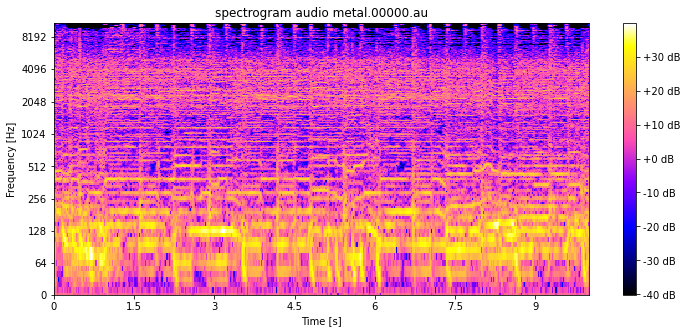

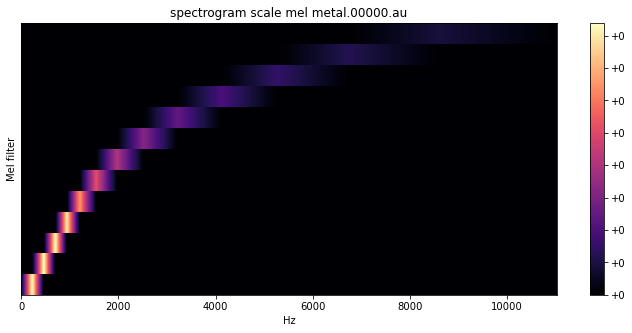

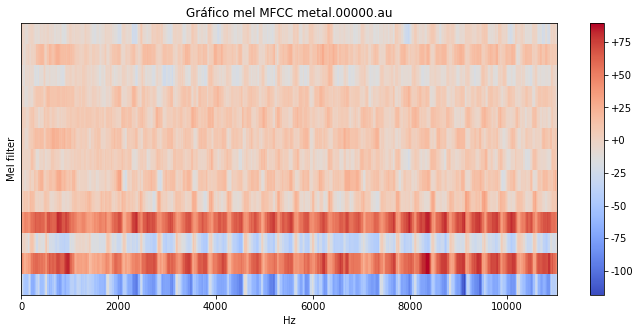

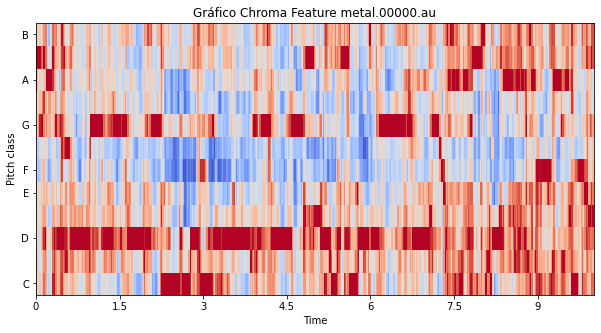

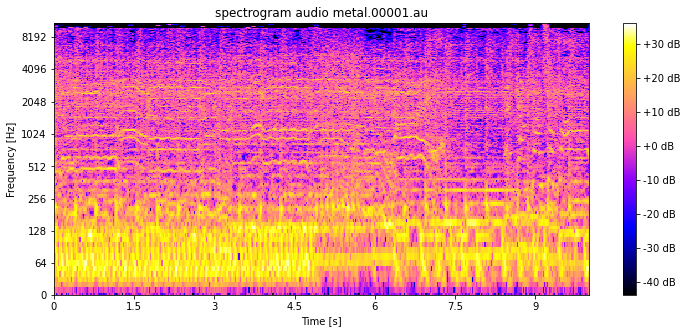

...

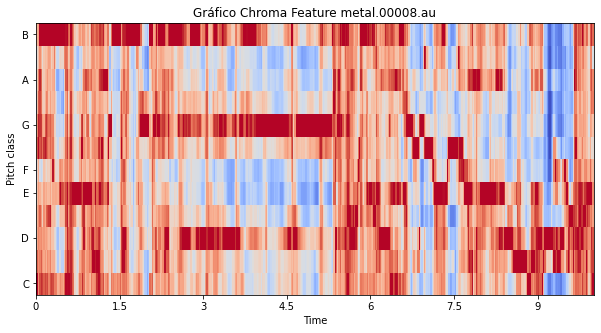

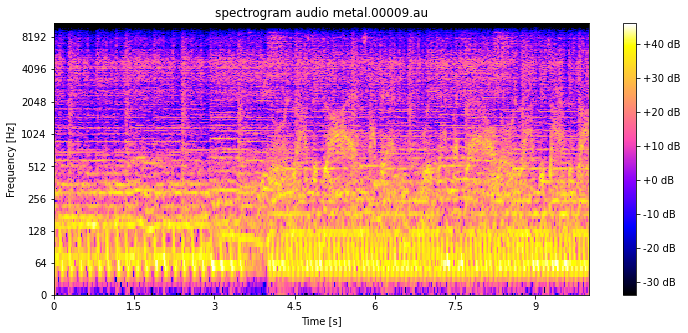

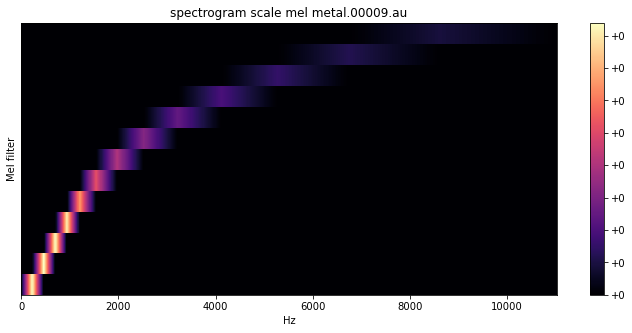

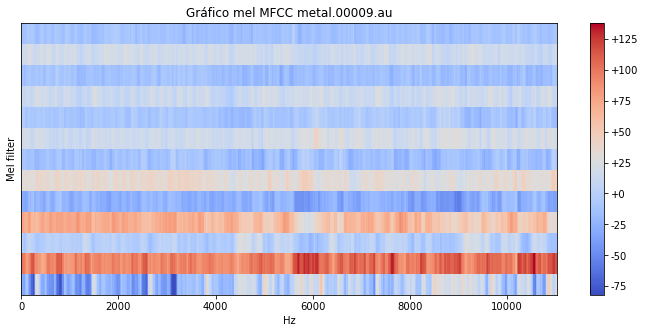

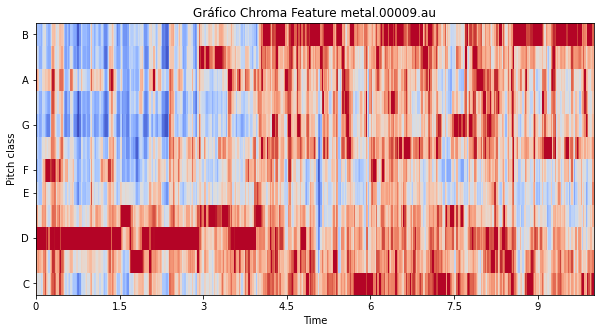

In [7]:
# For plotting headlessly
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

features = []
audio_dic = {}

for file in audio_files:
    # Carregando file
    sound, samplerate  = librosa.load(path=audio_path+file, offset=0, duration=10)
    #
    # 1. Espectograma em escala logartimo
    #
    # Aplicando Short Time Fourier Transform no audio
    F = librosa.stft(sound)
    # Calculando a magnitude
    Magnitude = np.abs(F)
    # Transformando os dados em decibeis
    Spectro = librosa.amplitude_to_db(Magnitude)
    # Adicionando feature a lista
    features.append(Spectro)    
    # Salvando Spectograma
    fig = plt.figure(figsize=(12,5))
    p = librosa.display.specshow(Spectro, sr=samplerate, y_axis='log' , x_axis='time', cmap='gnuplot2')
    plt.xlabel('Time [s]')
    plt.ylabel('Frequency [Hz]')
    title = "spectrogram audio {}".format(file)
    plt.title(title)
    plt.colorbar(format='%+2.0f dB')
    fig.savefig(file+'-spec.png')
    
    #
    # 2. Espectograma em escala de mel (MFCC) para n_mcc=13
    #
    mel = librosa.filters.mel(sr=samplerate, n_fft=2048 ,n_mels=13)
    # Adicionando feature a lista
    features.append(mel)    
    # Salvando o gráfico de mel
    fig = plt.figure(figsize=(12,5))
    p = librosa.display.specshow(mel, sr=samplerate, x_axis='linear');
    plt.ylabel('Mel filter');
    title = "spectrogram scale mel {}".format(file)
    plt.title(title)
    plt.colorbar(format='%+2.0f')
    fig.savefig(file+'-mel.png')
    
    #
    # 3. Grafico de mel pegando o mfcc

    mfcc = librosa.feature.mfcc(y=sound, sr=samplerate, n_mfcc=13)
    fig = plt.figure(figsize=(12,5))
    p = librosa.display.specshow(mfcc, sr=samplerate, x_axis='linear');
    plt.ylabel('Mel filter');
    title = "Gráfico mel MFCC {}".format(file)
    plt.title(title)
    plt.colorbar(format='%+2.0f')

    
    
    # 4. Chroma feature
    #
    chroma = librosa.feature.chroma_stft(S=Magnitude, sr=samplerate)
    # Adicionando feature a lista
    features.append(chroma)
    # Salvando Chroma feature
    fig = plt.figure(figsize=(10,5))
    p = librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', cmap='coolwarm')
    title = "Gráfico Chroma Feature {}".format(file)
    plt.title(title)
    fig.savefig(file+'-chroma.png')
    
    # Adicionando lista ao dicionario
    audio_dic[file] = features

### Quarto Pop

In [8]:
audio_path = 'mini-genres/pop/'
audio_files = ['pop.00000.au', 'pop.00001.au', 'pop.00002.au', 'pop.00003.au', \
             'pop.00004.au', 'pop.00005.au', 'pop.00006.au', 'pop.00007.au', \
             'pop.00008.au', 'pop.00009.au']

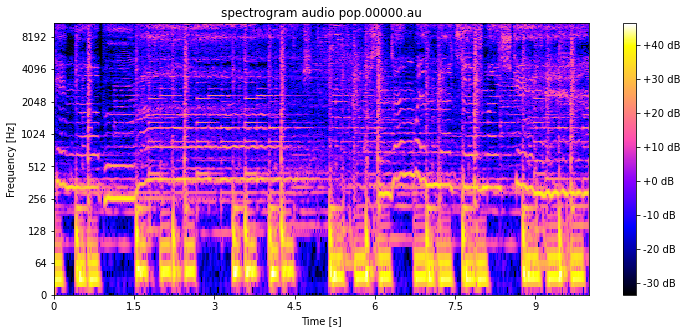

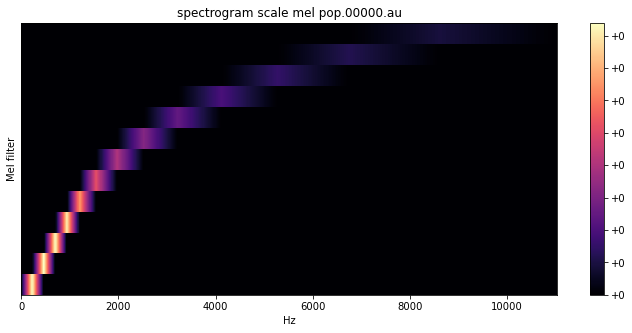

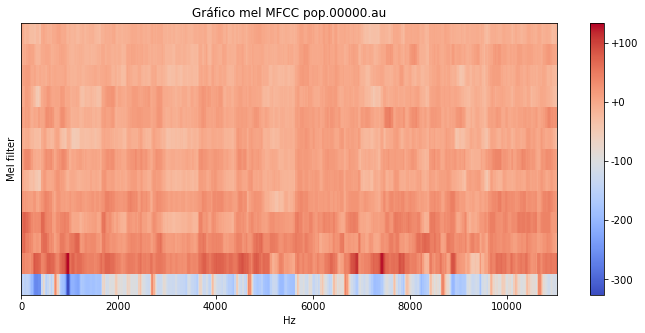

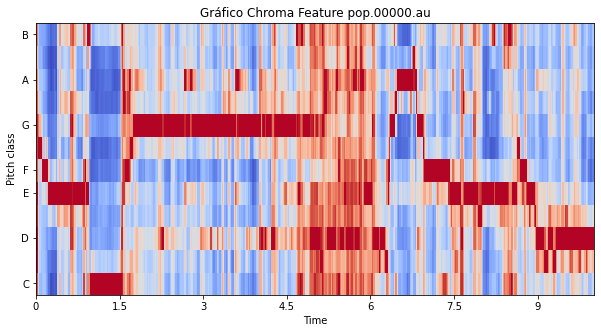

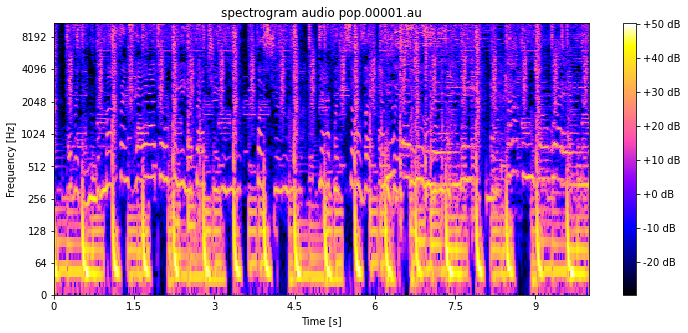

...

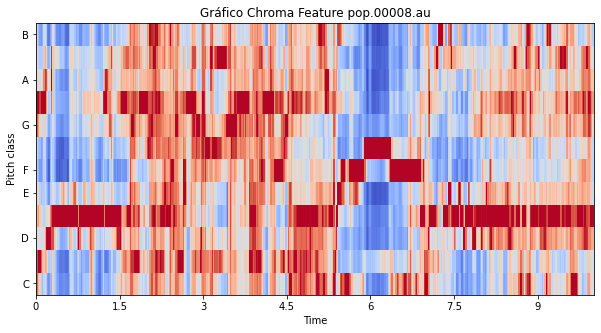

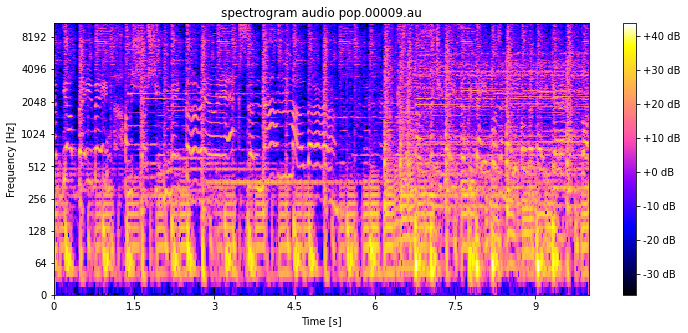

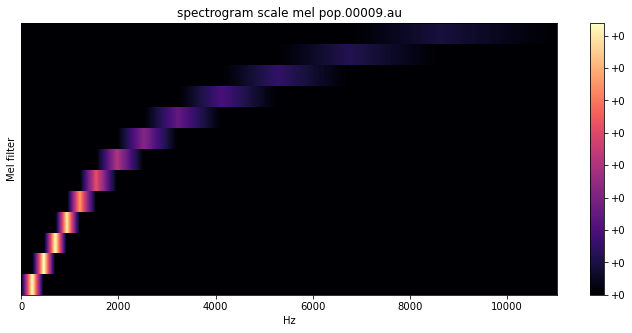

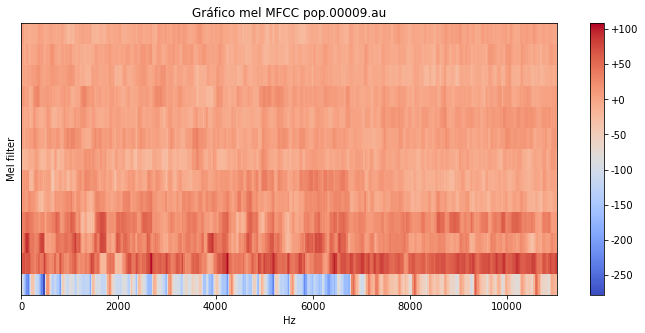

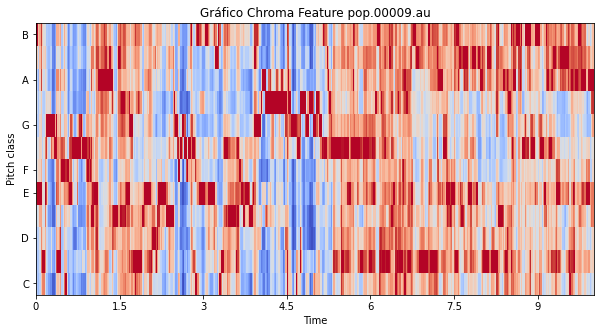

In [9]:
# For plotting headlessly
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

features = []
audio_dic = {}

for file in audio_files:
    # Carregando file
    sound, samplerate  = librosa.load(path=audio_path+file, offset=0, duration=10)
    #
    # 1. Espectograma em escala logartimo
    #
    # Aplicando Short Time Fourier Transform no audio
    F = librosa.stft(sound)
    # Calculando a magnitude
    Magnitude = np.abs(F)
    # Transformando os dados em decibeis
    Spectro = librosa.amplitude_to_db(Magnitude)
    # Adicionando feature a lista
    features.append(Spectro)    
    # Salvando Spectograma
    fig = plt.figure(figsize=(12,5))
    p = librosa.display.specshow(Spectro, sr=samplerate, y_axis='log' , x_axis='time', cmap='gnuplot2')
    plt.xlabel('Time [s]')
    plt.ylabel('Frequency [Hz]')
    title = "spectrogram audio {}".format(file)
    plt.title(title)
    plt.colorbar(format='%+2.0f dB')
    fig.savefig(file+'-spec.png')
    
    #
    # 2. Espectograma em escala de mel (MFCC) para n_mcc=13
    #
    mel = librosa.filters.mel(sr=samplerate, n_fft=2048 ,n_mels=13)
    # Adicionando feature a lista
    features.append(mel)    
    # Salvando o gráfico de mel
    fig = plt.figure(figsize=(12,5))
    p = librosa.display.specshow(mel, sr=samplerate, x_axis='linear');
    plt.ylabel('Mel filter');
    title = "spectrogram scale mel {}".format(file)
    plt.title(title)
    plt.colorbar(format='%+2.0f')
    fig.savefig(file+'-mel.png')
    
    #
    # 3. Grafico de mel pegando o mfcc

    mfcc = librosa.feature.mfcc(y=sound, sr=samplerate, n_mfcc=13)
    fig = plt.figure(figsize=(12,5))
    p = librosa.display.specshow(mfcc, sr=samplerate, x_axis='linear');
    plt.ylabel('Mel filter');
    title = "Gráfico mel MFCC {}".format(file)
    plt.title(title)
    plt.colorbar(format='%+2.0f')

    
    
    # 4. Chroma feature
    #
    chroma = librosa.feature.chroma_stft(S=Magnitude, sr=samplerate)
    # Adicionando feature a lista
    features.append(chroma)
    # Salvando Chroma feature
    fig = plt.figure(figsize=(10,5))
    p = librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', cmap='coolwarm')
    title = "Gráfico Chroma Feature {}".format(file)
    plt.title(title)
    fig.savefig(file+'-chroma.png')
    
    # Adicionando lista ao dicionario
    audio_dic[file] = features

### Sexto Rock

In [10]:
audio_path = 'mini-genres/rock/'
audio_files = ['rock.00000.au', 'rock.00001.au', 'rock.00002.au', 'rock.00003.au', \
             'rock.00004.au', 'rock.00005.au', 'rock.00006.au', 'rock.00007.au', \
             'rock.00008.au', 'rock.00009.au']

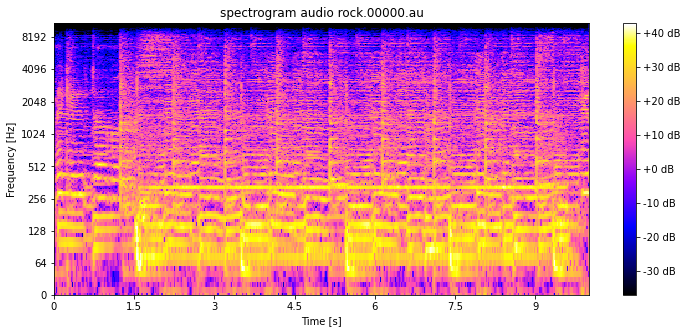

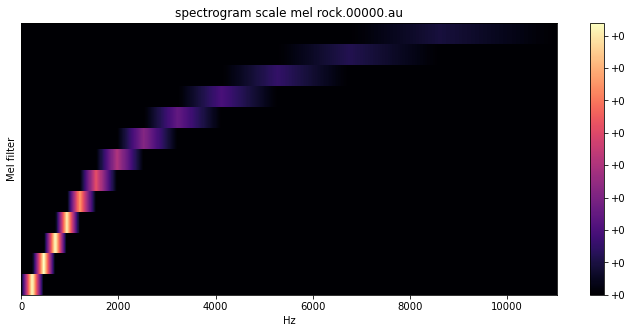

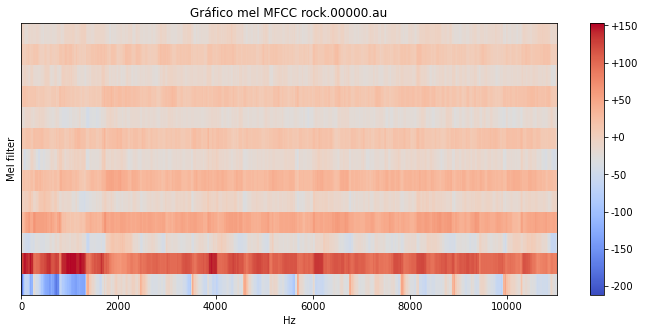

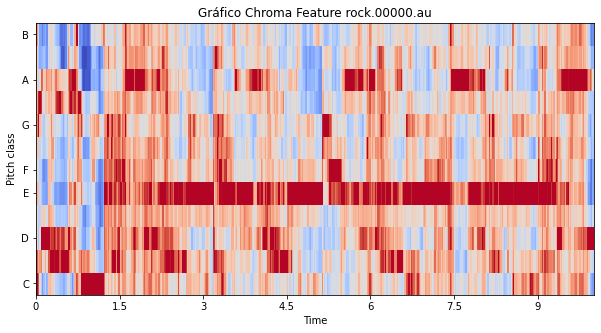

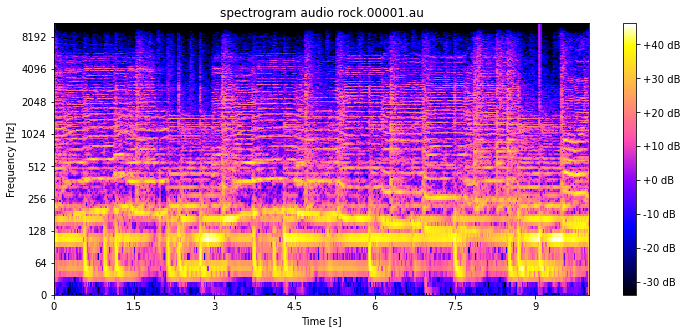

...

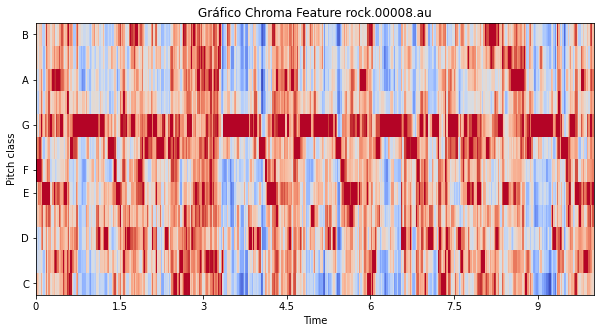

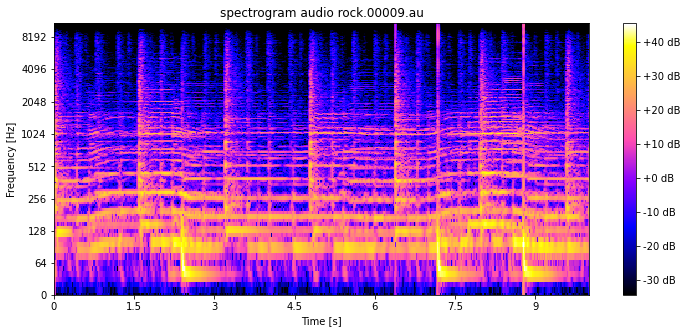

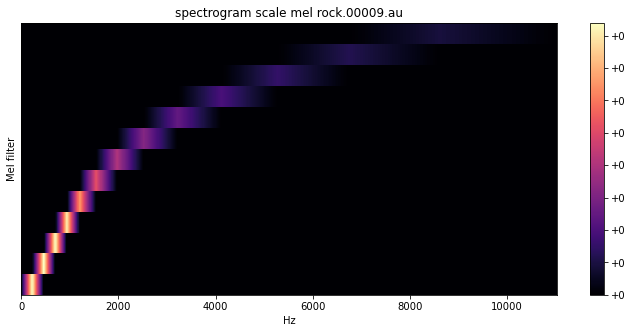

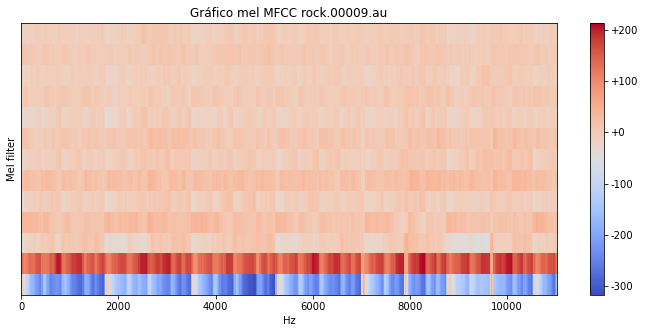

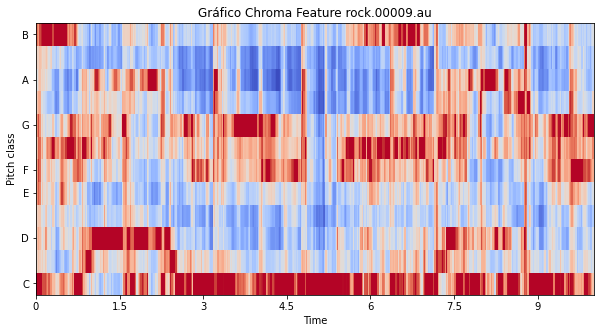

In [11]:
# For plotting headlessly
from matplotlib.backends.backend_agg import FigureCanvasAgg as FigureCanvas

features = []
audio_dic = {}

for file in audio_files:
    # Carregando file
    sound, samplerate  = librosa.load(path=audio_path+file, offset=0, duration=10)
    #
    # 1. Espectograma em escala logartimo
    #
    # Aplicando Short Time Fourier Transform no audio
    F = librosa.stft(sound)
    # Calculando a magnitude
    Magnitude = np.abs(F)
    # Transformando os dados em decibeis
    Spectro = librosa.amplitude_to_db(Magnitude)
    # Adicionando feature a lista
    features.append(Spectro)    
    # Salvando Spectograma
    fig = plt.figure(figsize=(12,5))
    p = librosa.display.specshow(Spectro, sr=samplerate, y_axis='log' , x_axis='time', cmap='gnuplot2')
    plt.xlabel('Time [s]')
    plt.ylabel('Frequency [Hz]')
    title = "spectrogram audio {}".format(file)
    plt.title(title)
    plt.colorbar(format='%+2.0f dB')
    fig.savefig(file+'-spec.png')
    
    #
    # 2. Espectograma em escala de mel (MFCC) para n_mcc=13
    #
    mel = librosa.filters.mel(sr=samplerate, n_fft=2048 ,n_mels=13)
    # Adicionando feature a lista
    features.append(mel)    
    # Salvando o gráfico de mel
    fig = plt.figure(figsize=(12,5))
    p = librosa.display.specshow(mel, sr=samplerate, x_axis='linear');
    plt.ylabel('Mel filter');
    title = "spectrogram scale mel {}".format(file)
    plt.title(title)
    plt.colorbar(format='%+2.0f')
    fig.savefig(file+'-mel.png')
    
    #
    # 3. Grafico de mel pegando o mfcc

    mfcc = librosa.feature.mfcc(y=sound, sr=samplerate, n_mfcc=13)
    fig = plt.figure(figsize=(12,5))
    p = librosa.display.specshow(mfcc, sr=samplerate, x_axis='linear');
    plt.ylabel('Mel filter');
    title = "Gráfico mel MFCC {}".format(file)
    plt.title(title)
    plt.colorbar(format='%+2.0f')

    
    
    # 4. Chroma feature
    #
    chroma = librosa.feature.chroma_stft(S=Magnitude, sr=samplerate)
    # Adicionando feature a lista
    features.append(chroma)
    # Salvando Chroma feature
    fig = plt.figure(figsize=(10,5))
    p = librosa.display.specshow(chroma, y_axis='chroma', x_axis='time', cmap='coolwarm')
    title = "Gráfico Chroma Feature {}".format(file)
    plt.title(title)
    fig.savefig(file+'-chroma.png')
    
    # Adicionando lista ao dicionario
    audio_dic[file] = features

### Criação do Dataset

In [12]:
colunas = 'Filename Tempo Magnitude Chroma_stft Rmse Spectral_centroid Spectral_bandwidth Rolloff Zero_crossing_rate Mel Flatness'
for i in range(1, 21):
    colunas += f' mfcc{i}'
colunas += ' Genero'
colunas = colunas.split()

In [13]:
file = open('data.csv', 'w', newline='')
with file:
    writer = csv.writer(file)
    writer.writerow(colunas)
genres = 'classical jazz metal pop rock'.split()
for g in genres:
    print(f'Genre:{g} started')
    start = time.time()
    for filename in os.listdir(f'mini-genres/{g}'):
        songname = f'mini-genres/{g}/{filename}'
        y, sr = librosa.load(songname, mono=True, duration=10,sr=None)
        F = librosa.stft(y)
        Magnitude = np.abs(F)
        Spectro = librosa.amplitude_to_db(Magnitude)
        chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)
        rms = librosa.feature.rms(y=y)
        spec_cent = librosa.feature.spectral_centroid(y=y, sr=sr)
        spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)
        rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)
        zcr = librosa.feature.zero_crossing_rate(y)
        mfcc = librosa.feature.mfcc(y=y, sr=sr)
        tempo = float(librosa.beat.tempo(y=y, sr=sr)[0])
        mel = librosa.filters.mel(sr=sr, n_fft=2048 ,n_mels=13)
        flat = librosa.feature.spectral_flatness(y=y)
        to_append = f'{filename} {tempo} {np.mean(Magnitude)} {np.mean(chroma_stft)} {np.mean(rms)} {np.mean(spec_cent)} {np.mean(spec_bw)} {np.mean(rolloff)} {np.mean(zcr)} {np.mean(mel)} {np.mean(flat)}'    
        for e in mfcc:
            to_append += f' {np.mean(e)}'
        to_append += f' {g}'
        file = open('data.csv', 'a', newline='')
        
        with file:
            writer = csv.writer(file)
            writer.writerow(to_append.split())

Genre:classical started
Genre:jazz started
Genre:metal started
Genre:pop started
Genre:rock started


In [14]:
data = pd.read_csv('data.csv')

In [15]:
data.dropna(axis=1, inplace=True)

In [16]:
data

,Filename,Tempo,Magnitude,Chroma_stft,Rmse,Spectral_centroid,Spectral_bandwidth,Rolloff,Zero_crossing_rate,Mel,...,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,Genero
0,classical.00000.au,95.703125,0.247021,0.242334,0.034683,1526.506461,1561.054868,2694.922838,0.102315,0.000091,...,8.897853,-5.014579,-2.270800,4.483426,5.982706,-0.909630,0.446173,0.257944,0.777596,classical
1,classical.00001.au,117.453835,0.155333,0.256414,0.025272,1280.272463,1485.010026,2406.972452,0.070448,0.000091,...,3.988781,-2.921231,-0.167744,-0.670958,-0.597680,-5.924984,-3.283360,3.331626,3.883476,classical
2,classical.00002.au,99.384014,0.373694,0.256931,0.050694,1495.266058,1562.242113,2707.288192,0.095153,0.000091,...,9.697680,-1.642883,5.063808,2.081608,3.796679,0.218529,5.016940,-4.637394,-4.940502,classical
3,classical.00003.au,135.999178,0.179318,0.218015,0.030667,1609.368570,1469.725238,2977.052764,0.121502,0.000091,...,7.122271,6.862778,5.313977,-3.452572,0.383771,-0.530067,-2.001078,4.315912,7.652899,classical
4,classical.00004.au,112.347147,0.269824,0.224833,0.041095,1623.192474,1665.357292,3079.023222,0.099495,0.000091,...,-0.333227,-6.020127,6.269034,-2.272077,3.441704,-4.611488,-6.699569,-3.310897,0.901229,classical
5,classical.00005.au,143.554688,0.393435,0.269120,0.051571,1448.650589,1612.183759,2881.027668,0.076164,0.000091,...,3.367268,-8.735683,-0.372194,-5.241159,2.108952,0.290066,4.375462,2.393208,1.826204,classical
6,classical.00006.au,99.384014,0.205052,0.244553,0.030345,1561.472294,1667.511359,3119.366752,0.092020,0.000091,...,6.825321,2.021564,7.676106,3.861110,0.361519,-2.749420,-1.262263,0.852988,4.926311,classical
7,classical.00007.au,103.359375,0.206895,0.315203,0.032141,1079.654036,1411.905301,2151.396813,0.048870,0.000091,...,-1.263564,-4.007390,-3.137400,1.915467,1.915457,0.739705,1.707975,1.246129,0.095755,classical
8,classical.00008.au,135.999178,0.209851,0.276429,0.028732,1354.596023,1533.853602,2668.168707,0.067411,0.000091,...,0.762734,0.256441,3.370090,9.053717,13.335873,7.351202,2.134558,-1.868181,3.582661,classical
9,classical.00009.au,129.199219,0.106024,0.254027,0.016696,1464.205823,1727.757866,3073.852256,0.075744,0.000091,...,7.009961,1.409957,2.938393,-3.333023,-4.218771,-7.262414,-2.138438,-0.931220,-1.564295,classical


### Separando em treino e teste

In [17]:
df_treino, df_teste = train_test_split(data, test_size = 0.2, random_state = 1)
df_treino, df_teste = df_treino.copy(), df_teste.copy()

x_treino = df_treino[['Tempo', 'Magnitude', 'Chroma_stft', 'Rmse', 'Spectral_centroid', 'Spectral_bandwidth', 'Rolloff',
                       'Zero_crossing_rate', 'Mel', 'Flatness', 'mfcc1', 'mfcc2', 'mfcc3', 'mfcc4', 'mfcc5', 'mfcc6', 'mfcc7',
                       'mfcc8', 'mfcc9', 'mfcc10', 'mfcc11', 'mfcc12', 'mfcc13', 'mfcc14', 'mfcc15', 'mfcc16', 'mfcc17', 'mfcc18',
                       'mfcc19', 'mfcc20']]
x_teste = df_teste[['Tempo', 'Magnitude', 'Chroma_stft', 'Rmse', 'Spectral_centroid', 'Spectral_bandwidth', 'Rolloff',
                       'Zero_crossing_rate', 'Mel', 'Flatness', 'mfcc1', 'mfcc2', 'mfcc3', 'mfcc4', 'mfcc5', 'mfcc6', 'mfcc7',
                       'mfcc8', 'mfcc9', 'mfcc10', 'mfcc11', 'mfcc12', 'mfcc13', 'mfcc14', 'mfcc15', 'mfcc16', 'mfcc17', 'mfcc18',
                       'mfcc19', 'mfcc20']]
y_treino = df_treino.loc[:,'Genero']
y_teste = df_teste.loc[:,'Genero']

### Testando com os modelos abaixo

In [18]:
rf = RandomForestClassifier(
    n_estimators = 500, 
    max_samples = 0.8, 
    max_features = 0.5, 
    max_depth = 8,
    n_jobs = 4,
)

In [19]:
%%time
rf.fit(x_treino, y_treino)

Wall time: 810 ms


RandomForestClassifier(max_depth=8, max_features=0.5, max_samples=0.8,
                       n_estimators=500, n_jobs=4)

In [20]:
y_treino_pred = rf.predict_proba(x_treino)[:, 1]
y_teste_pred = rf.predict_proba(x_teste)[:, 1]

In [21]:
# testado o modelo catboost, use_best_model params farão o modelo prevenir overfitting, calcula valores multiclasse
model = CatBoostClassifier(iterations=400,
                           learning_rate=0.05,
                           l2_leaf_reg=3.5,
                           depth=8,
                           rsm=0.98,
                           loss_function='MultiClass',
                           eval_metric='AUC',
                           use_best_model=True,
                           random_seed=42)

In [22]:
model.fit(x_treino,y_treino,cat_features=[],eval_set=(x_teste,y_teste))

0:	test: 0.5000000	best: 0.5000000 (0)	total: 150ms	remaining: 59.7s
1:	test: 0.5666667	best: 0.5666667 (1)	total: 161ms	remaining: 32.1s
2:	test: 0.5833333	best: 0.5833333 (2)	total: 171ms	remaining: 22.6s
3:	test: 0.6000000	best: 0.6000000 (3)	total: 181ms	remaining: 18s
4:	test: 0.6000000	best: 0.6000000 (3)	total: 191ms	remaining: 15.1s
5:	test: 0.6000000	best: 0.6000000 (3)	total: 201ms	remaining: 13.2s
6:	test: 0.6000000	best: 0.6000000 (3)	total: 211ms	remaining: 11.8s
7:	test: 0.6000000	best: 0.6000000 (3)	total: 221ms	remaining: 10.8s
8:	test: 0.6000000	best: 0.6000000 (3)	total: 230ms	remaining: 9.98s
9:	test: 0.6000000	best: 0.6000000 (3)	total: 239ms	remaining: 9.34s
10:	test: 0.6000000	best: 0.6000000 (3)	total: 249ms	remaining: 8.79s
11:	test: 0.6000000	best: 0.6000000 (3)	total: 259ms	remaining: 8.36s
12:	test: 0.6000000	best: 0.6000000 (3)	total: 268ms	remaining: 7.98s
13:	test: 0.6000000	best: 0.6000000 (3)	total: 277ms	remaining: 7.64s
14:	test: 0.6000000	best: 0.6000

123:	test: 0.5833333	best: 0.6000000 (3)	total: 1.21s	remaining: 2.69s
124:	test: 0.5833333	best: 0.6000000 (3)	total: 1.22s	remaining: 2.68s
125:	test: 0.5833333	best: 0.6000000 (3)	total: 1.23s	remaining: 2.67s
126:	test: 0.5833333	best: 0.6000000 (3)	total: 1.23s	remaining: 2.65s
127:	test: 0.5833333	best: 0.6000000 (3)	total: 1.24s	remaining: 2.63s
128:	test: 0.5833333	best: 0.6000000 (3)	total: 1.25s	remaining: 2.62s
129:	test: 0.5833333	best: 0.6000000 (3)	total: 1.25s	remaining: 2.6s
130:	test: 0.5833333	best: 0.6000000 (3)	total: 1.26s	remaining: 2.58s
131:	test: 0.5833333	best: 0.6000000 (3)	total: 1.26s	remaining: 2.57s
132:	test: 0.5833333	best: 0.6000000 (3)	total: 1.27s	remaining: 2.56s
133:	test: 0.5833333	best: 0.6000000 (3)	total: 1.28s	remaining: 2.55s
134:	test: 0.5833333	best: 0.6000000 (3)	total: 1.29s	remaining: 2.53s
135:	test: 0.5833333	best: 0.6000000 (3)	total: 1.3s	remaining: 2.52s
136:	test: 0.5833333	best: 0.6000000 (3)	total: 1.3s	remaining: 2.51s
137:	test

255:	test: 0.5833333	best: 0.6000000 (3)	total: 2.25s	remaining: 1.26s
256:	test: 0.5833333	best: 0.6000000 (3)	total: 2.26s	remaining: 1.25s
257:	test: 0.5833333	best: 0.6000000 (3)	total: 2.26s	remaining: 1.24s
258:	test: 0.5833333	best: 0.6000000 (3)	total: 2.27s	remaining: 1.24s
259:	test: 0.5833333	best: 0.6000000 (3)	total: 2.28s	remaining: 1.23s
260:	test: 0.5833333	best: 0.6000000 (3)	total: 2.29s	remaining: 1.22s
261:	test: 0.5833333	best: 0.6000000 (3)	total: 2.29s	remaining: 1.21s
262:	test: 0.5833333	best: 0.6000000 (3)	total: 2.3s	remaining: 1.2s
263:	test: 0.5833333	best: 0.6000000 (3)	total: 2.31s	remaining: 1.19s
264:	test: 0.5833333	best: 0.6000000 (3)	total: 2.32s	remaining: 1.18s
265:	test: 0.5833333	best: 0.6000000 (3)	total: 2.33s	remaining: 1.17s
266:	test: 0.5833333	best: 0.6000000 (3)	total: 2.33s	remaining: 1.16s
267:	test: 0.5833333	best: 0.6000000 (3)	total: 2.34s	remaining: 1.15s
268:	test: 0.5833333	best: 0.6000000 (3)	total: 2.35s	remaining: 1.15s
269:	tes

379:	test: 0.5833333	best: 0.6000000 (3)	total: 3.29s	remaining: 173ms
380:	test: 0.5833333	best: 0.6000000 (3)	total: 3.3s	remaining: 165ms
381:	test: 0.5833333	best: 0.6000000 (3)	total: 3.31s	remaining: 156ms
382:	test: 0.5833333	best: 0.6000000 (3)	total: 3.32s	remaining: 147ms
383:	test: 0.5833333	best: 0.6000000 (3)	total: 3.33s	remaining: 139ms
384:	test: 0.5833333	best: 0.6000000 (3)	total: 3.34s	remaining: 130ms
385:	test: 0.5833333	best: 0.6000000 (3)	total: 3.34s	remaining: 121ms
386:	test: 0.5833333	best: 0.6000000 (3)	total: 3.35s	remaining: 113ms
387:	test: 0.5833333	best: 0.6000000 (3)	total: 3.36s	remaining: 104ms
388:	test: 0.5833333	best: 0.6000000 (3)	total: 3.37s	remaining: 95.2ms
389:	test: 0.5833333	best: 0.6000000 (3)	total: 3.38s	remaining: 86.6ms
390:	test: 0.5833333	best: 0.6000000 (3)	total: 3.39s	remaining: 78ms
391:	test: 0.5833333	best: 0.6000000 (3)	total: 3.39s	remaining: 69.3ms
392:	test: 0.5833333	best: 0.6000000 (3)	total: 3.4s	remaining: 60.6ms
393:	

In [23]:
y_treino_pred = model.predict_proba(x_treino)[:, 1]
y_teste_pred = model.predict_proba(x_teste)[:, 1]

In [24]:
model.best_score_

{'learn': {'MultiClass': 0.07999466905976707},
 'validation': {'AUC:type=Mu': 0.6, 'MultiClass': 0.6927087401180718}}

In [25]:
y_teste_pred

array([0.19585734, 0.19896647, 0.19831979, 0.19481889, 0.20010823,
       0.199606  , 0.2010153 , 0.19750137, 0.19919526, 0.19654789])